# Visualization of the results

This notebook visualizes the results and plots samples of reconstructed pointclouds.


In [1]:
import json 
import glob
import torch
import pandas as pd
from IPython.display import display

from shapesynthesis.plotting import plot_recon_2d, plot_recon_3d

In [2]:
def model_to_cate(model):
    name = model.split("_")[-1]
    return name.title()


def model_to_modelname(model):
    name_list = model.split("_")[:-1]
    name = " ".join(name_list)
    return name.title()


def visualize_2d_model(model,num_pc=5):
    recon_pcs = torch.load(f'./results/{model}/reconstructions.pt').cpu().detach().squeeze().numpy()
    reference_pcs = torch.load(f'./results/{model}/references.pt').cpu().detach().squeeze().numpy()
    plot_recon_2d(recon_pcs=recon_pcs[:num_pc],ref_pcs=reference_pcs[:num_pc],num_pc=num_pc)

def visualize_2d_genmodel(model,num_pc=5):
    recon_pcs = torch.load(f'./results/{model}/samples.pt').cpu().detach().squeeze().numpy()
    reference_pcs = torch.load(f'./results/{model}/references.pt').cpu().detach().squeeze().numpy()
    plot_recon_2d(recon_pcs=recon_pcs[:num_pc],ref_pcs=reference_pcs[:num_pc],num_pc=num_pc)


def visualize_3d_model(model,scale=1.0,num_pc:int=5):
    recon_pcs = scale*torch.load(f'./results/{model}/reconstructions.pt').cpu().detach().squeeze().numpy()
    reference_pcs = scale*torch.load(f'./results/{model}/references.pt').cpu().detach().squeeze().numpy()
    plot_recon_3d(recon_pcs=recon_pcs,ref_pcs=reference_pcs,num_pc=num_pc)

def visualize_3d_genmodel(model,scale=1.0,num_pc:int=5,offset:int=0):
    recon_pcs = scale*torch.load(f'./results/{model}/samples.pt').cpu().detach().squeeze().numpy()
    reference_pcs = scale*torch.load(f'./results/{model}/references.pt').cpu().detach().squeeze().numpy()
    plot_recon_3d(recon_pcs=recon_pcs,ref_pcs=reference_pcs,num_pc=num_pc,offset=offset)


def visualize_2d_rendered(folder,ectsize,num_pc=5):
    recon_pcs = torch.load(f'./results/{folder}/reconstructions_{ectsize}.pt').cpu().detach().squeeze().numpy()
    reference_pcs = torch.load(f'./results/{folder}/references_{ectsize}.pt').cpu().detach().squeeze().numpy()
    plot_recon_2d(recon_pcs=recon_pcs,ref_pcs=reference_pcs,num_pc=num_pc)

In [3]:
recon_pcs = torch.load(f'./results/encoder_downsample_car/reconstructions.pt').cpu().detach().squeeze().numpy()
print(recon_pcs.shape)

FileNotFoundError: [Errno 2] No such file or directory: './results/encoder_downsample_car/reconstructions.pt'

# Reconstruction Evaluation.

The encoder is the `encoder` and the rendered model is the point cloud
optimization rendering (a non-parametric method). The latter clearly outperforms 
all models.  

In [4]:
fn = glob.glob("./results/**/**.json")

results = []
for filename in fn:
    with open(filename,"r") as f:
        results.extend(json.load(f))

df = pd.DataFrame(results)
df = df.drop(["fscore","normalized"],axis=1)
df["MMD-CD"] *= 1e4 
df["MMD-EMD"] *= 1e3 

df["dataset"] = df["model"].apply(model_to_cate)
df["model"] = df["model"].apply(model_to_modelname)
df = df[["MMD-CD","MMD-EMD","model","dataset"]]
df = df.groupby(by=["model","dataset"]).agg(["mean"])

df = df.unstack().swaplevel(1,2,axis=1).swaplevel(0,1,axis=1).sort_index(axis=1)

display(df)

dataset               Mnist               Sparse           
                     MMD-CD    MMD-EMD    MMD-CD    MMD-EMD
                       mean       mean      mean       mean
model                                                      
Encoder           43.732589  12.694084       NaN        NaN
Encoder Airplane        NaN        NaN  9.605098  16.771188

The generative results.

In [5]:
fn = glob.glob("./results/**/render_**.json")

results = []
for filename in fn:
    with open(filename,"r") as f:
        results.extend(json.load(f))

df = pd.DataFrame(results)
df = df.drop(["fscore","normalized"],axis=1)
df["MMD-CD"] *= 1e4 
df["MMD-EMD"] *= 1e3 

df["dataset"] = df["model"].apply(model_to_cate)
df["model"] = df["model"].apply(model_to_modelname)
df = df[["MMD-CD","MMD-EMD","model","dataset"]]
df = df.groupby(by=["model","dataset"]).agg(["mean"])

df = df.unstack().swaplevel(1,2,axis=1).swaplevel(0,1,axis=1).sort_index(axis=1)

display(df)

KeyError: "['fscore', 'normalized'] not found in axis"

In [48]:
fn = glob.glob("./results/**/**_gen.json")

results = []
for filename in fn:
    with open(filename,"r") as f:
        results.extend(json.load(f))

df = pd.DataFrame(results)
df = df[["model","1-NN-CD-acc","1-NN-EMD-acc"]]
 
df["dataset"] = df["model"].apply(model_to_cate)
df["model"] = df["model"].apply(model_to_modelname)
df = df.groupby(by=["model","dataset"]).agg(["mean"])

display(df)

1-NN-CD-acc 1-NN-EMD-acc
                      mean         mean
model dataset                          
Vae   Airplane    0.792969     0.500000
      Car         0.623580     0.632102
      Chair       0.719788     0.690332
      Mnist       0.703125     0.625000

# Example Outputs

## Generation

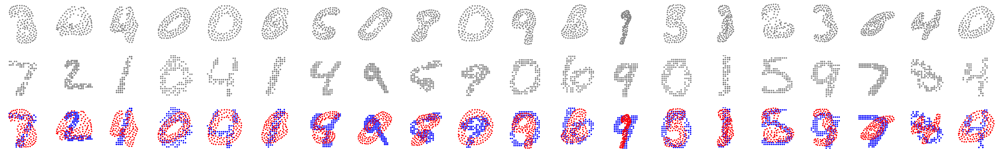

In [49]:
visualize_2d_genmodel("vae_mnist",num_pc=20)

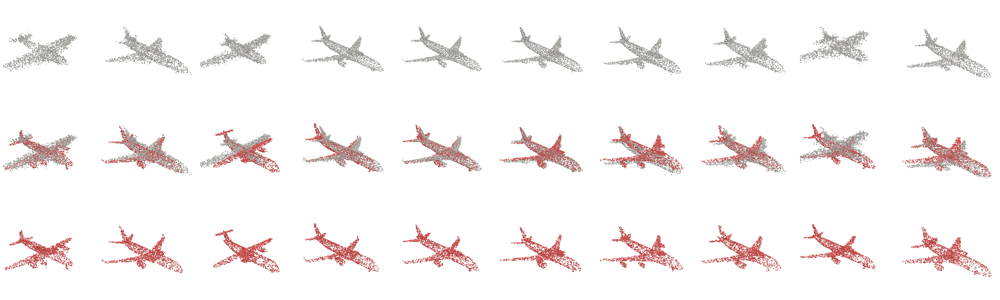

In [50]:
visualize_3d_genmodel("vae_airplane",scale=10,num_pc=10,offset=20)

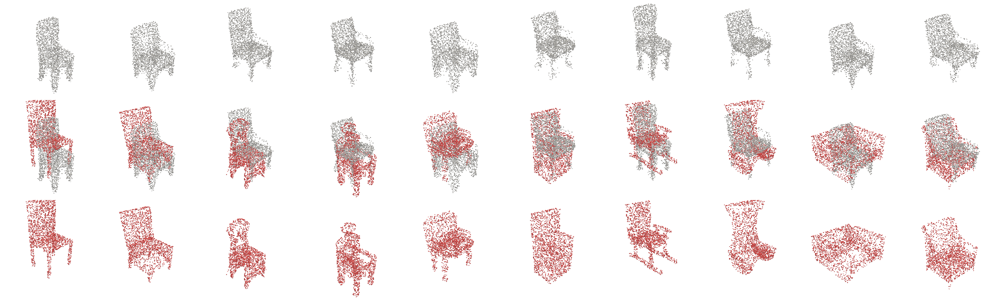

In [51]:
visualize_3d_genmodel("vae_chair",scale=6,num_pc=10,offset=10)

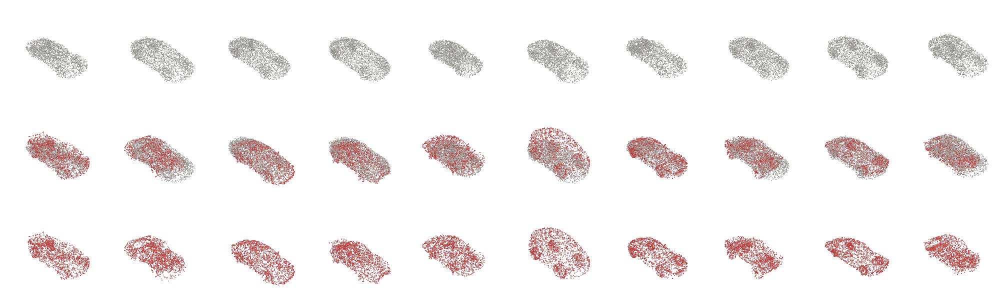

In [52]:
visualize_3d_genmodel("vae_car",scale=6,num_pc=10,offset=20)

# Reconstruction

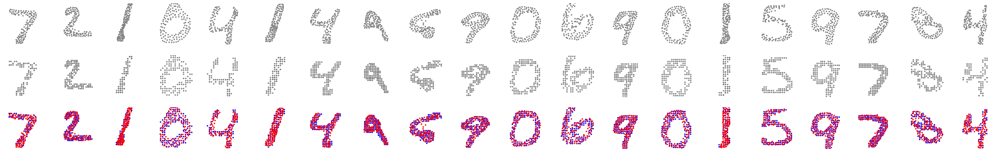

In [53]:
visualize_2d_model("encoder_mnist",num_pc=20)

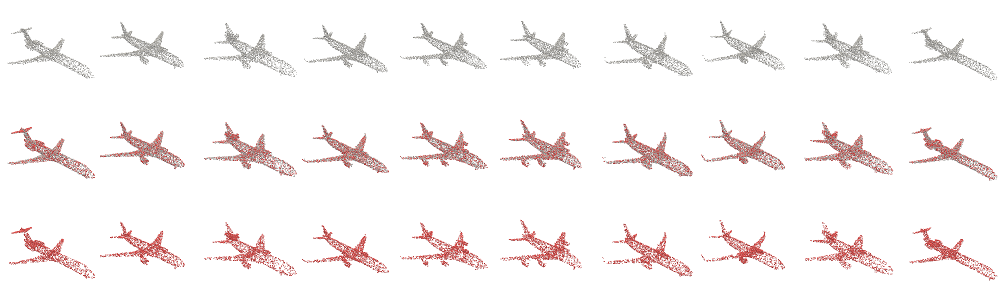

In [54]:
visualize_3d_model("encoder_airplane",scale=10,num_pc=10)

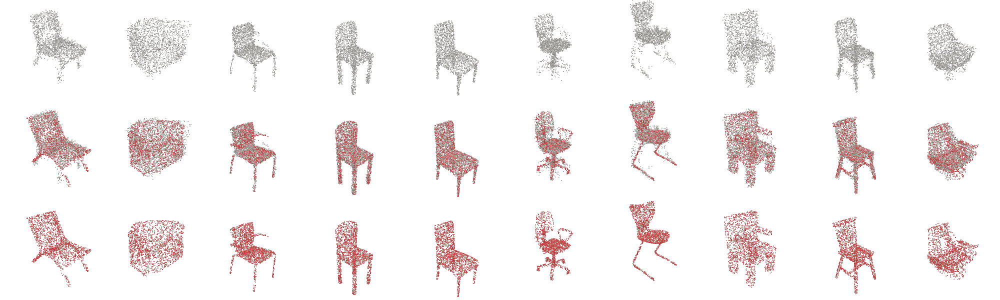

In [55]:
visualize_3d_model("encoder_chair",scale=6,num_pc=10)

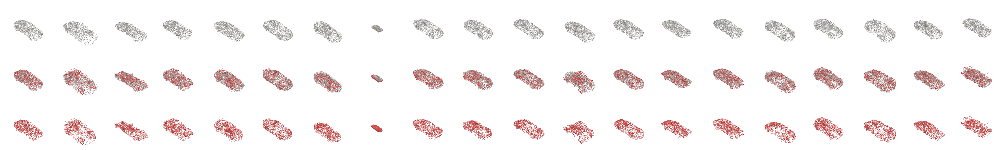

In [56]:
visualize_3d_model("vae_car",scale=6,num_pc=20)

# Downsample

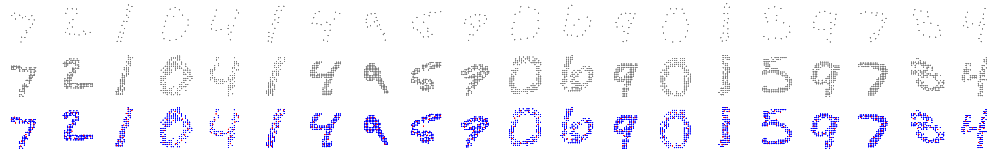

In [57]:
visualize_2d_model("encoder_downsample_mnist",num_pc=20)

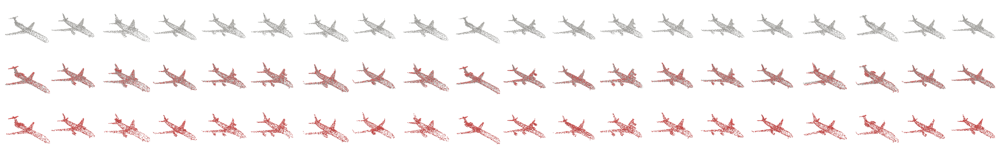

In [58]:
visualize_3d_model("encoder_downsample_airplane",scale=10, num_pc=20)

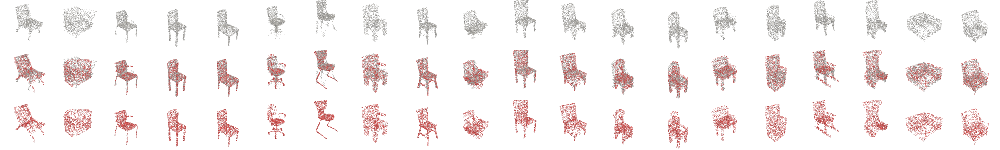

In [59]:
visualize_3d_model("encoder_downsample_chair",scale=6, num_pc=20)

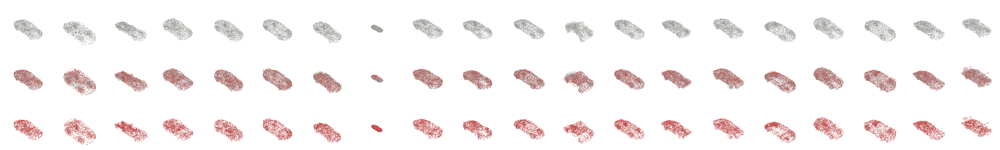

In [60]:
visualize_3d_model("encoder_downsample_car",scale=6, num_pc=20)

# Upsample

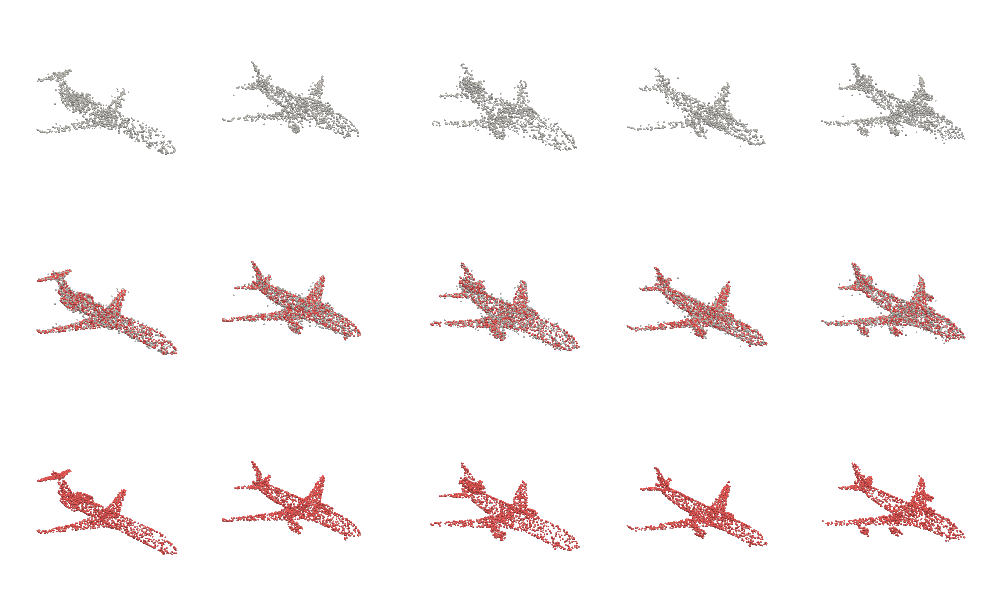

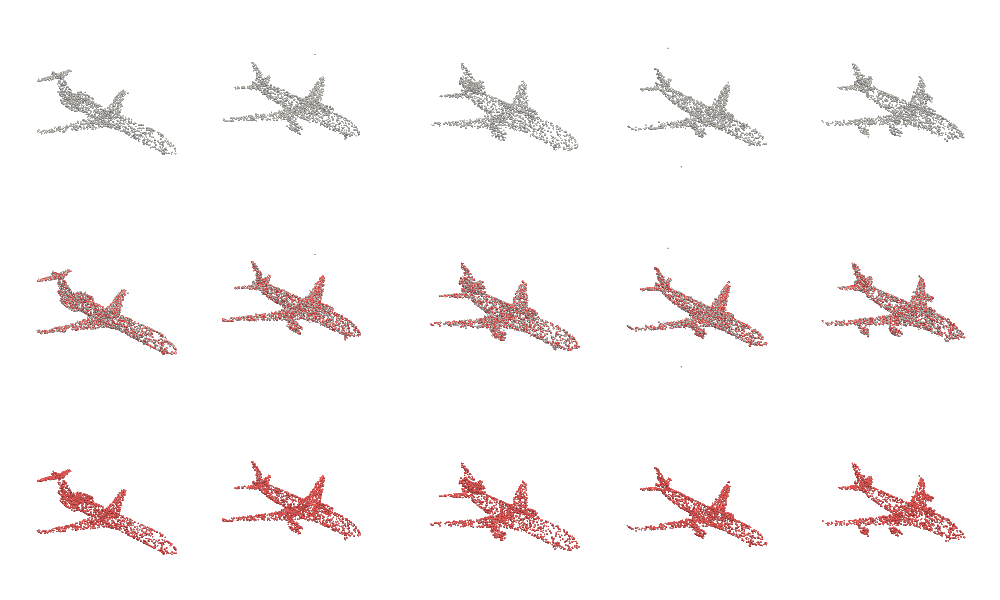

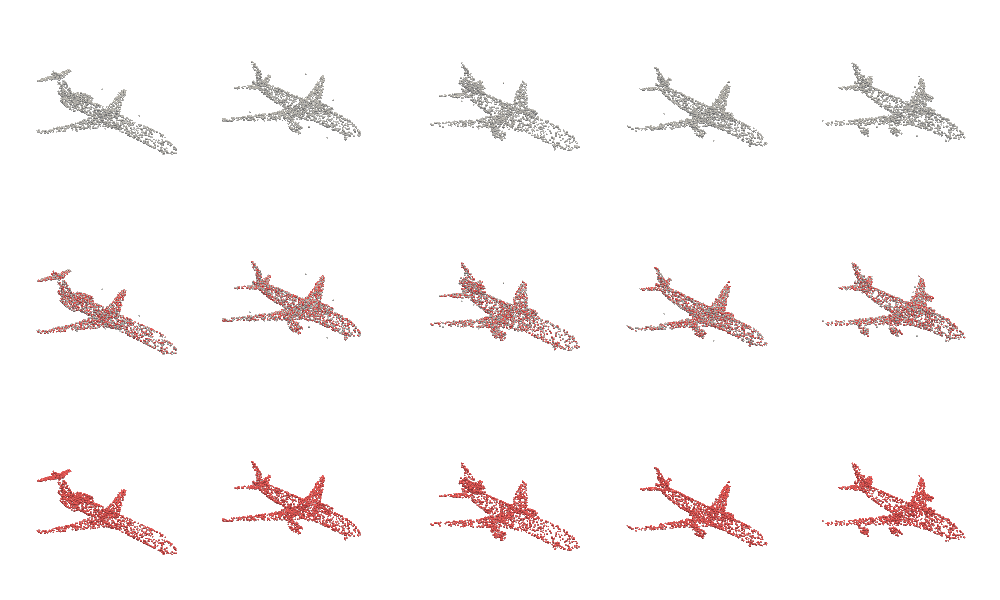

In [61]:
def plot_rendered(cate,resolution,scale=1):
    recon_pcs = scale*torch.load(f'./results/rendered/reconstructions_{cate}_{resolution}.pt').cpu().detach().squeeze().numpy()
    reference_pcs = scale*torch.load(f'./results/rendered/references_{cate}_{resolution}.pt').cpu().detach().squeeze().numpy()
    plot_recon_3d(recon_pcs=recon_pcs,ref_pcs=reference_pcs)

plot_rendered("airplane","64")
plot_rendered("airplane","128")
plot_rendered("airplane","256")

# Downsample Airplane

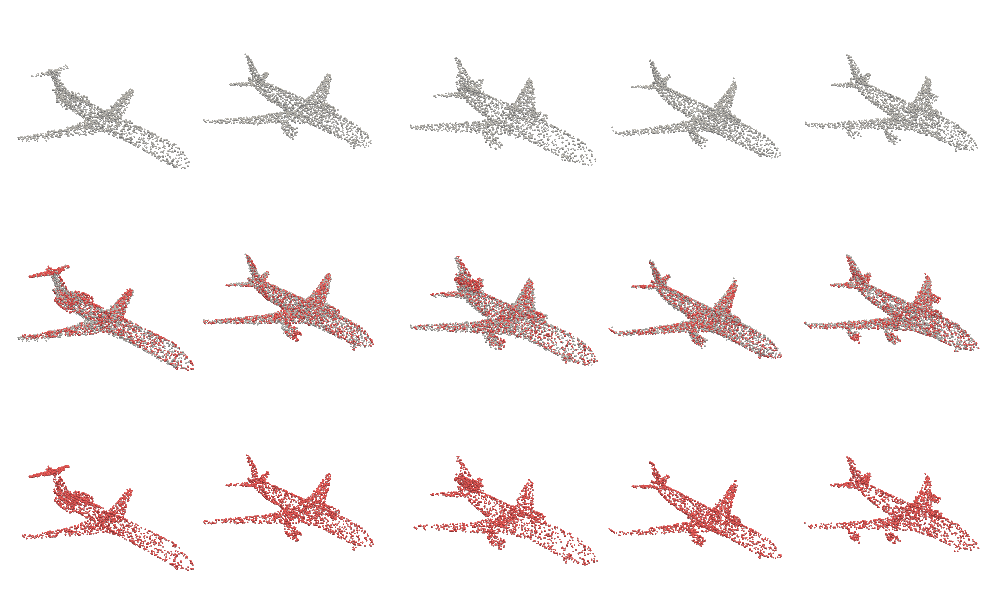

In [62]:
visualize_3d_model("encoder_downsample_airplane",scale=10)

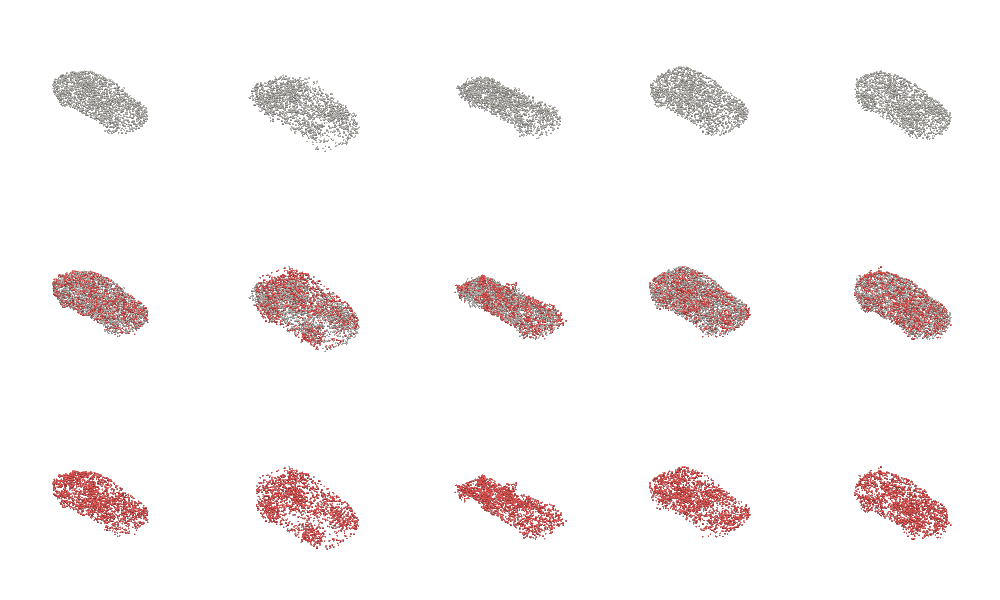

In [63]:
visualize_3d_model("encoder_downsample_car",scale=5)

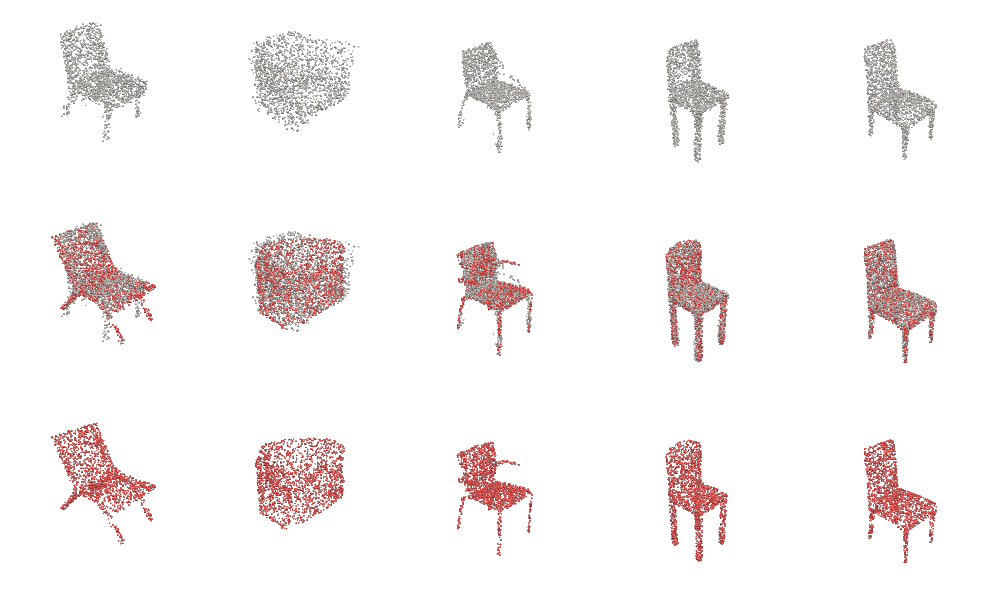

In [64]:
visualize_3d_model("encoder_downsample_chair",scale=5)

# Render

In [ ]:
def visualize_3d_model(model,scale=1.0,num_pc:int=5):
    recon_pcs = scale*torch.load(f'./results/rendered_ect/{model}/reconstructions.pt').cpu().detach().squeeze().numpy()
    reference_pcs = scale*torch.load(f'./results/{model}/references.pt').cpu().detach().squeeze().numpy()
    plot_recon_3d(recon_pcs=recon_pcs,ref_pcs=reference_pcs,num_pc=num_pc)


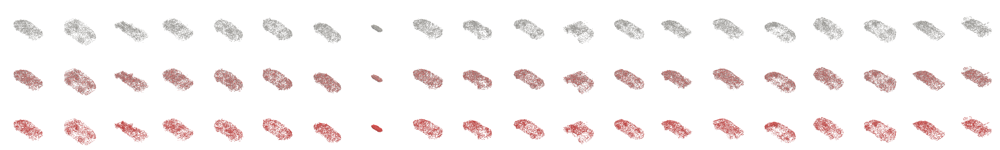

In [15]:


scale = 6.0
num_pc = 20

recon_pcs = scale*torch.load(f'./results/rendered_ect/car/128_128_car_reconstructions.pt').cpu().detach().squeeze().numpy()
reference_pcs = scale*torch.load(f'./results/rendered_ect/car/references.pt').cpu().detach().squeeze().numpy()
plot_recon_3d(recon_pcs=recon_pcs,ref_pcs=reference_pcs,num_pc=num_pc)
